# UDACITY MLND Capstone Project (Tanbir Ahmed)

## On Classification of the STL-10 dataset using Deep CNN and Transfer Learning

# Content

* ****
1. **Modules to import**
* **Device check**
* **Configuration**
* **Load STL-10 Labeled data**
* **Exploratory visualization of the dataset**
* **Categorize labels**
* **Normalize image data**
* **General Model from scratch**
* **Feature extraction and finetuning using pre-trained Imagenet model (ResNet50)**
* **Augmentation for the Model from Scratch**
* **Performance summary of the CNN model from scratch**
* **Conclusion**
* ****

# Required resources

* **Disk space:** Approximately 8GB (with models and data saved)
* **Memory:** Approximately 16GB 
* **CPU/GPU:** A GPU is recommended for faster training (we used GTX 1060)
* **Libraries:** Keras, Tensorflow, Scikit-learn, OpenCV
* **Data:** ./stl10/train_X.bin, ./stl10/train_y.bin, ./stl10/test_X.bin, ./stl10/test_y.bin, ./stl10/unlabeled_X.bin
    * Data can be downloaded from https://cs.stanford.edu/~acoates/stl10/
* **Directories:**
    * Bottleneck features (for original train data and test data with ResNet50): ./bottleneck_features
    * Augmented train data (for saving augmented training data): ./augmented_train_data
    * Finetuned model saved (for saving finetuned ResNet50 model): ./best_model_saved  
    * Random images from the internet: ./images

# 1. Modules to import

In [1]:
import numpy as np
from tqdm import tqdm
import os
import shutil
from shutil import copyfile
import scipy
from scipy import misc

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

import csv
import random
import glob
import cv2

import keras
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint   
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50, preprocess_input

from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, GlobalAveragePooling2D, Flatten, BatchNormalization

Using TensorFlow backend.


# 2. Device check

We use GeForce GTX 1060 GPU for execution of the code. The following code checks availability of available devices.

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

import tensorflow as tf
sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))

[name: "/cpu:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9893526384083690255
, name: "/gpu:0"
device_type: "GPU"
memory_limit: 5026453913
locality {
  bus_id: 1
}
incarnation: 12992959889438061827
physical_device_desc: "device: 0, name: GeForce GTX 1060, pci bus id: 0000:01:00.0"
]


# 3. Configuration

In [3]:
config = {
    'data_directory' : './stl10',
    'augmented_train_data' : './augmented_train_data',
    'ResNet50' : {
        'name' : 'ResNet50',
        'input_shape' : (197, 197, 3),
        'dataset' : 'STL-10',
        'features_file_train' : './bottleneck_features/ResNet50_STL-10_features_train.npz',
        'features_file_test' : './bottleneck_features/ResNet50_STL-10_features_test.npz',
        'model_file_saved' : './best_model_saved/ResNet50_STL-10_model_best.hdf5'
    }
}

# 4. Load STL-10 Labeled Data

In [4]:
# load the data
class load_data:    
    def read_labels(path_to_labels):        
        with open(path_to_labels, 'rb') as f:
            labels = np.fromfile(f, dtype=np.uint8) - 1        
        return labels

    def read_all_images(path_to_data):    
        with open(path_to_data, 'rb') as f:
            # read whole file in uint8 chunks
            everything = np.fromfile(f, dtype=np.uint8)
            images = np.reshape(everything, (-1, 3, 96, 96))
            images = np.transpose(images, (0, 3, 2, 1))
        return images

x_train = load_data.read_all_images(config['data_directory'] + '/train_X.bin')    
y_train = load_data.read_labels(config['data_directory'] + '/train_y.bin')    

x_test = load_data.read_all_images(config['data_directory'] + '/test_X.bin')    
y_test = load_data.read_labels(config['data_directory'] + '/test_y.bin')    
        
y_train = np.squeeze(y_train)
print('Data loaded')


print("Number of training examples =", x_train.shape[0])
print("Number of testing examples =", x_test.shape[0])
print("Image data shape =", x_train.shape[1:])
print("Number of classes =", len(set(y_train)))

Data loaded
Number of training examples = 5000
Number of testing examples = 8000
Image data shape = (96, 96, 3)
Number of classes = 10


# 5. Exploratory visualization of the dataset

In [61]:
class Summary:
    def __init__(self, X_train, y_train, n_classes):
        self.X_train = X_train
        self.y_train = y_train
        self.n_classes = n_classes
        
        self.labels_text = ['Airplane', 'Bird', 'Car', 'Cat', 'Deer', 'Dog', 'Horse', 'Monkey', 'Ship', 'Truck']
        
    def labels_frequency(self):
        # histogram of label frequency
        hist, bins = np.histogram(self.y_train, bins=self.n_classes)
        width = 0.75 * (bins[1] - bins[0])
        center = (bins[:-1] + bins[1:]) / 2
        plt.bar(center, hist, align='center', width=width)
        plt.show()
        
    def random_data(self, n=10):
        images = []
        labels = []
        for i in range(n):
            index = random.randint(0, len(self.X_train))
            image = self.X_train[index]
            images.append(image)
            labels.append(self.y_train[index])
        return images, labels
    
    def images_from_a_folder(self, files):
        images = []
        for i, img in enumerate(glob.glob(files)):
            image = cv2.imread(img)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            images.append(image)
        return images
    
    def display_data(self, images, labels, n_rows, n_cols):
        # show image of 'count' random data points
        plt.figure(figsize=(30, 15), dpi=128)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(30,15))
        fig.subplots_adjust(hspace = .20, wspace=.15)
        axs = axs.ravel()

        for i in range(n_cols*n_rows):
            axs[i].axis('off')
            axs[i].imshow(images[i])
            axs[i].set_title(self.labels_text[labels[i]], fontsize=20)
            
    def image_histograms(self, images, labels, n_rows, n_cols):
        plt.figure(figsize=(30, 15), dpi=128)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(30,15))
        fig.subplots_adjust(hspace = .20, wspace=.15)
        axs = axs.ravel()

        for i in range(n_cols*n_rows):
            axs[i].axis('off')
            gray_img = cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY)
            hist = cv2.calcHist([images[i]],[0],None,[96],[0,96])
            axs[i].hist(gray_img.ravel(),96,[0,96])
            axs[i].set_title(self.labels_text[labels[i]], fontsize=20)

## 5.1. Frequency distribution

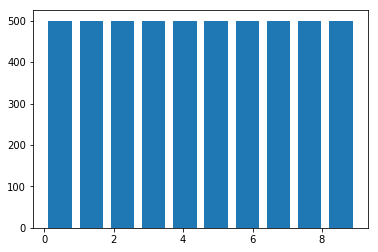

In [62]:
# Training data visualization
#########################################################################
s = Summary(x_train, y_train, 10)          

s.labels_frequency()

## 5.2. Random images

<Figure size 3840x1920 with 0 Axes>

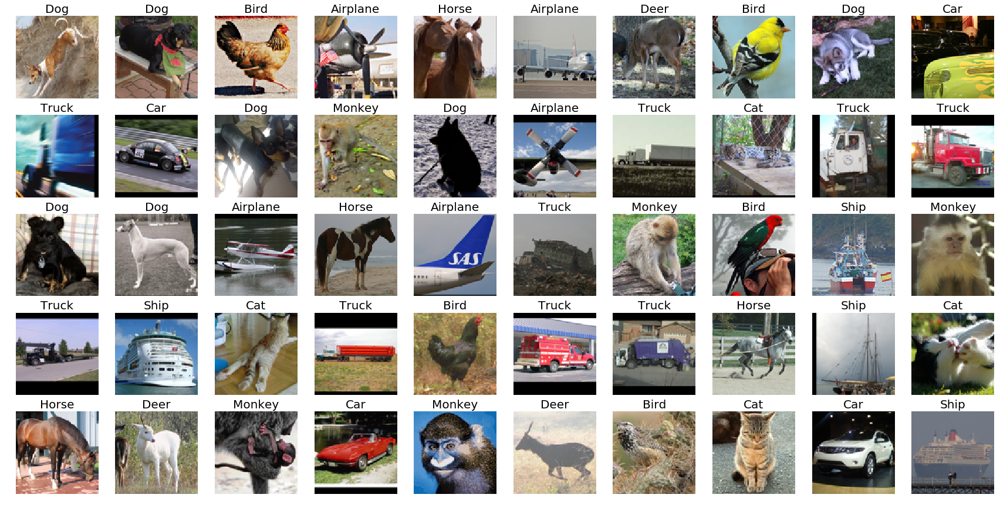

In [7]:
# Display random images with correct labels
images, labels = s.random_data(50)
s.display_data(images, labels, 5, 10)

## 5.3. Intensity histograms of images in 5.2

<Figure size 3840x1920 with 0 Axes>

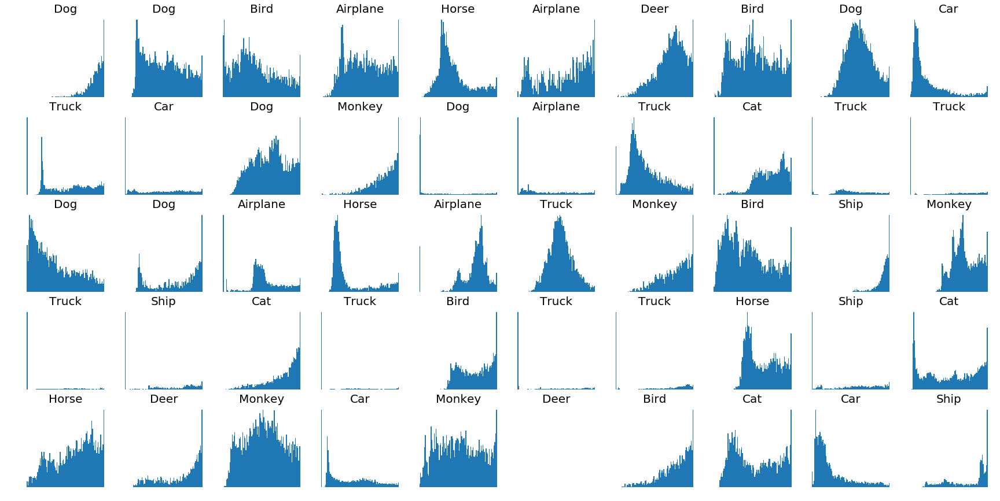

In [8]:
s.image_histograms(images, labels, 5, 10)

# 6. Categorize labels

In [9]:
# one-hot encode the labels
y_train_categorical = np_utils.to_categorical(y_train, 10)
y_test_categorical = np_utils.to_categorical(y_test, 10)
print('Labels processed')

Labels processed


# 7. Normalize image data

In [10]:
print("Training data mean before normalizing: ", np.mean(x_train))
x_train_normalized = (x_train)/255.0
print("Training data mean after normalizing: ", np.mean(x_train_normalized))

print("Test data mean before normalizing: ", np.mean(x_test))
x_test_normalized = (x_test)/255.0
print("Test data mean after normalizing: ", np.mean(x_test_normalized))

Training data mean before normalizing:  109.919187146
Training data mean after normalizing:  0.431055635865
Test data mean before normalizing:  109.80558034
Test data mean after normalizing:  0.430610118982


# 8. General Model form Scratch

## 8.1. Architecture overview

We intend to design a simple architecture of a Convolutional Neural Network (CNN) from the scratch that preserves symmetry with the following properties:
* Equal number of channels in all the convolutional layers
* Same Kernel shape for all the convolutional layers
* Each convolutional layer is followed by a Batch normalization layer and a 2x2 MaxPooling layer
* Height of the fully connected layer is proportional to the number of output channels in the convolutional layers
* Each Flattened or fully-connected layer (except the softmax output layer) contains a dropout layer with the same keep-probability

## 8.2. Function specification

In [11]:
class ModelFromScratch():
    def __init__(self):
        self.model = None
        
    def build(self, input_shape, conv_depths, c_size, fc_heights, act, n_classes):
        from keras.layers.convolutional import Conv2D, MaxPooling2D
        from keras.layers import BatchNormalization, Flatten
        from keras.models import Input, Model, Sequential        

        n_conv = len(conv_depths)
        inp = Input(input_shape) 
        x = inp
        for i in range(n_conv):
            x = Conv2D(conv_depths[i], (c_size,c_size), activation=act)(x)
            x = BatchNormalization()(x)
            x = MaxPooling2D((2,2), strides=(2, 2))(x)

        x = Flatten()(x)
        x = Dropout(0.5)(x)

        n_fc = len(fc_heights)
        for i in range(n_fc):
            x = Dense(fc_heights[i], activation=act)(x)
            x = Dropout(0.5)(x)

        x = Dense(n_classes, activation='softmax')(x)

        self.model = Model(inputs=inp, outputs=x)
    
    def compile(self, rate, beta_1, beta_2):
        opt = keras.optimizers.Adam(lr=rate, beta_1=beta_1, beta_2=beta_2)
        self.model.compile(loss='categorical_crossentropy', 
                           optimizer=opt, 
                           metrics=['accuracy'])
        
    def fit(self, file, epochs):
        checkpointer = ModelCheckpoint(filepath=file, monitor='val_acc', verbose=1, save_best_only=True)

        import os
        if os.path.isfile(file):
            self.model.load_weights(file)
        self.model.fit(x_train_normalized, y_train_categorical, batch_size=128, epochs=epochs, validation_split=0.2, 
                       callbacks=[checkpointer], verbose=2, shuffle=True)  

    def fit_augmented(self, file, epochs):
        checkpointer = ModelCheckpoint(filepath=file, monitor='val_acc', verbose=1, save_best_only=True)

        import os
        if os.path.isfile(file):
            self.model.load_weights(file)
        self.model.fit(x_train_augmented_normalized, y_train_augmented_categorical, 
                       batch_size=128, epochs=epochs, validation_split=0.2, 
                       callbacks=[checkpointer], verbose=2, shuffle=True)     
        
    def test(self, file):    
        self.model.load_weights(file)
        # evaluate test accuracy
        score = self.model.evaluate(x_test_normalized, y_test_categorical, verbose=2)
        accuracy = 100*score[1]

        # print test accuracy
        print('Test accuracy: %.4f%%' % accuracy)
        
    def predict(self, img):
        pred = self.model.predict(img)
        return pred
        
    def summary(self):
        self.model.summary()

## 8.3. Build, Compile, Fit, and Test

### Build and Compile

Define the following variables:
* $N$ = number of convolutional layers
* $m$ = number of channels in each of the $N$ convolutional layers
* $t$ for the kernel shape ($t\times t$) 
* $m\times 16$ = size of the only fully-connected layer before the output layer

Upon tuning over the following values
* $N \in \{3,4\}$,
* $m \in \{32, 48, 64, 80, 96\}$, and
* $t \in \{3,4,5\}$,

we have found consistantly above 60% test accuracy with $N=3$, $m=80$, and $t=4$.

In [12]:
model = ModelFromScratch()
model.build(x_train_normalized.shape[1:], [80, 80, 80], 4, [1280], 'relu', 10)
model.summary()
model.compile(rate=0.00009, beta_1=0.99, beta_2=0.999)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 96, 96, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 93, 93, 80)        3920      
_________________________________________________________________
batch_normalization_1 (Batch (None, 93, 93, 80)        320       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 46, 46, 80)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 43, 43, 80)        102480    
_________________________________________________________________
batch_normalization_2 (Batch (None, 43, 43, 80)        320       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 21, 21, 80)        0         
__________

### Fit and Test

### 8.3.1. Fit original training subset (5000 x 96 x 96 x 3)

In [33]:
if os.path.isfile('model_80x3_4_1280_relu_original_5000.hdf5'):
    pass
else:
    model.fit('model_80x3_4_1280_relu_original_5000.hdf5', epochs=50)

Train on 4000 samples, validate on 1000 samples
Epoch 1/50
 - 11s - loss: 3.9772 - acc: 0.2472 - val_loss: 2.0534 - val_acc: 0.3950

Epoch 00001: val_acc improved from -inf to 0.39500, saving model to model_80x3_4_1280_relu_original_5000.hdf5
Epoch 2/50
 - 10s - loss: 2.6860 - acc: 0.3623 - val_loss: 1.6759 - val_acc: 0.4540

Epoch 00002: val_acc improved from 0.39500 to 0.45400, saving model to model_80x3_4_1280_relu_original_5000.hdf5
Epoch 3/50
 - 10s - loss: 2.1246 - acc: 0.4210 - val_loss: 1.5248 - val_acc: 0.4520

Epoch 00003: val_acc did not improve
Epoch 4/50
 - 10s - loss: 1.8530 - acc: 0.4517 - val_loss: 1.4379 - val_acc: 0.4640

Epoch 00004: val_acc improved from 0.45400 to 0.46400, saving model to model_80x3_4_1280_relu_original_5000.hdf5
Epoch 5/50
 - 10s - loss: 1.6386 - acc: 0.4903 - val_loss: 1.3738 - val_acc: 0.4950

Epoch 00005: val_acc improved from 0.46400 to 0.49500, saving model to model_80x3_4_1280_relu_original_5000.hdf5
Epoch 6/50
 - 10s - loss: 1.4060 - acc: 0

### 8.3.2. Test using weights trained from original data (5000 x 96 x96 x3)

In [34]:
if os.path.isfile('model_80x3_4_1280_relu_original_5000.hdf5'):
    model.test('model_80x3_4_1280_relu_original_5000.hdf5')
else:
    pass

Test accuracy: 61.6000%


**Comment**

We have been able to obtain a test accuracy more than 60% on the test subset with the weights trained on the original training dataset which was part of the goal of the project.

# 9. Feature extraction and finetuning using a pre-trained Imagenet model

We use the **ResNet50** pre-trained Imagenet model to extract features from STL-10 training dataset and then finetune it to use it as a classifier of the STL-10 dataset. We use the classifier (with at least 90% accuracy on the STL-10 test subset) to label the STL-10 unlabeled dataset.

In [35]:
class FeaturesExtractor:
    def __init__(self, 
                 model_config):
        self.model_config = model_config
        self.name = model_config['name']
        self.input_shape = model_config['input_shape']        
        self.features_file_train = model_config['features_file_train']
        self.features_file_test = model_config['features_file_test']
        self.model_file_saved = model_config['model_file_saved']
        
        self.model = ResNet50(weights='imagenet', include_top=False, input_shape=self.input_shape)            
        print('Output shape:', self.model.output_shape)
        print('model loaded')

    
    def extract_imageset_features(self, images, file=None):
        print('Reshaping images')
        resized_images = np.array([scipy.misc.imresize(images[i], self.input_shape) 
                            for i in tqdm(range(0, len(images)))]).astype('float32')
        print('Images resized')
        
        print('Preprocessing images')
        preprocessed_input = preprocess_input(resized_images)        
        print('Images preprocessed')
        
        print('Features extraction - starts')
        features = []
        for i in tqdm(range(0, len(images))):            
            img_features = self.model.predict(np.expand_dims(resized_images[i], axis=0))         
            features.append(img_features)
        features = np.squeeze(features)         
        print('Features extraction - completed')
        
        if file != None:
            print('Saving features...')
            np.savez(file, features=features)
            print('Features saved')
        return features
    
    def extract_image_features(self, image, file=None):
        resized_image = scipy.misc.imresize(image, self.input_shape).astype('float32')
        preprocessed_input = preprocess_input(resized_image)        
        features = self.model.predict(np.expand_dims(resized_image, axis=0))         
        features = np.squeeze(features)         
        return features
    
    def extract_train_features(self, X):
        if os.path.exists(self.features_file_train):
            print('Bottleneck features detected (train)')
            features = np.load(self.features_file_train)['features']
            print('Bottleneck features (train) loaded')
        else:
            features = self.extract_imageset_features(X, file=self.features_file_train)
        return features
            
    def extract_test_features(self, X):
        if os.path.exists(self.features_file_test):
            print('Bottleneck features detected (test)')
            features = np.load(self.features_file_test)['features']
            print('Bottleneck features (test) loaded')
        else:
            features = self.extract_imageset_features(X, file=self.features_file_test)
        return features

    
    def extract_unlabeled_imageset_features(self, images):
        resized_images = np.array([scipy.misc.imresize(images[i], self.input_shape) 
                            for i in range(0, len(images))]).astype('float32')
        preprocessed_input = preprocess_input(resized_images)        
        
        print('Features extraction - starts')
        features = []
        for i in tqdm(range(0, len(images))):            
            img_features = self.model.predict(np.expand_dims(resized_images[i], axis=0))         
            features.append(img_features)
        features = np.squeeze(features)         
        print('Features extraction - completed')
        return features
    
    def extract_unlabeled_features(self, X, i):
        file = self.model_config["features_file_unlabeled_"+i]
        if os.path.exists(file):
            print('Bottleneck features detected (unlabeled)')
            features = np.load(file)['features']
            print('Bottleneck features (unlabeled) loaded')
        else:
            features = self.extract_imageset_features(X, file=file)
        return features

## 9.1. Feature Extraction

In [36]:
# ResNet50 has output shape = 1x1x2048 
x = FeaturesExtractor(config['ResNet50'])

Output shape: (None, 1, 1, 2048)
model loaded


## 9.2. Training features

In [37]:
train_features = x.extract_train_features(x_train)

Bottleneck features detected (train)
Bottleneck features (train) loaded


### 9.2.1. TSNE embedding of bottleneck features for Training set

tsne features detected (test)
tsne features obtained


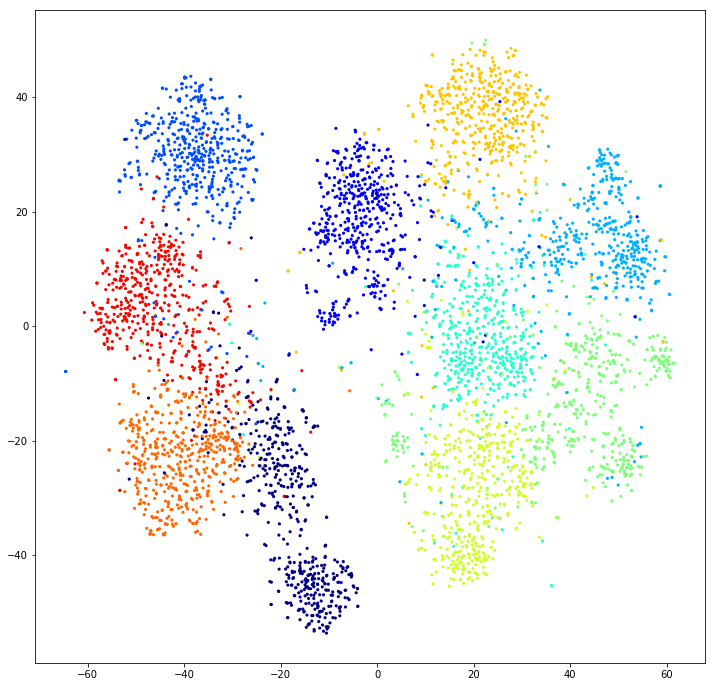

In [38]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

# reshape bottleneck features + reduce dimensionality with t-SNE
if os.path.exists('tsne_features.npz'):
    print('tsne features detected (test)')
    tsne_features = np.load('tsne_features.npz')['tsne_features']
else:
    print('tsne features not detected (test)')
    print('calculating now ...') 
    # fit_trainform: transform data into lower dimension
    tsne_features = TSNE(learning_rate=100).fit_transform(train_features) 
    np.savez('tsne_features', tsne_features=tsne_features)
print('tsne features obtained')

# plot the features
plt.figure(figsize=(12,12))
plt.scatter(tsne_features[:,0], tsne_features[:,1], c=plt.cm.jet(y_train/10), s=10, edgecolors='none')
plt.show()

**Analysis:**

The bottleneck features of ResNet50 provides encouraging result as shown in the plot above where points representing same-class objects are in the neighborhood on the 2D plot. Thus training a classifier on the bottleneck features would provide better validation and test performance.

### 9.2.2. Finetuning and classification layers with bottleneck features as input

In [39]:
def Model(input_shape):
    model = Sequential()    
    model.add(Dense(512, activation='relu', input_shape=input_shape))
    model.add(BatchNormalization(axis=-1))
    model.add(Dropout(0.5))
    
    # 6 gives 93.850% test acc
    for i in range(6):
        model.add(Dense(256, activation='relu'))
        model.add(BatchNormalization(axis=-1))
        #model.add(Dropout(0.3))
    
    model.add(Dense(10, activation='softmax'))
    return model

### 9.2.3. Compile

In [40]:
modelResNet50 = Model(train_features.shape[1:])
modelResNet50.summary()

modelResNet50.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 512)               1049088   
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
batch_normalization_2 (Batch (None, 256)               1024      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               65792     
_________________________________________________________________
batch_normalization_3 (Batch (None, 256)               1024      
__________

### 9.2.4. Fit

In [206]:
checkpointer = ModelCheckpoint(filepath=config['ResNet50']['model_file_saved'], monitor='val_acc', 
                               verbose=1, save_best_only=True)

if os.path.isfile(config['ResNet50']['model_file_saved']):
    modelResNet50.load_weights(config['ResNet50']['model_file_saved'])
    
modelResNet50.fit(train_features, y_train_categorical, batch_size=30, epochs=100, validation_split=0.2, 
                  callbacks=[checkpointer], verbose=2, shuffle=True)

Train on 4000 samples, validate on 1000 samples
Epoch 1/100
 - 3s - loss: 0.0292 - acc: 0.9913 - val_loss: 0.3221 - val_acc: 0.9100

Epoch 00001: val_acc improved from -inf to 0.91000, saving model to ./stl10/best_model_saved/ResNet50_STL-10_model_best.hdf5
Epoch 2/100
 - 3s - loss: 0.0181 - acc: 0.9945 - val_loss: 0.2955 - val_acc: 0.9280

Epoch 00002: val_acc improved from 0.91000 to 0.92800, saving model to ./stl10/best_model_saved/ResNet50_STL-10_model_best.hdf5
Epoch 3/100
 - 3s - loss: 0.0170 - acc: 0.9943 - val_loss: 0.3319 - val_acc: 0.9240

Epoch 00003: val_acc did not improve
Epoch 4/100
 - 3s - loss: 0.0252 - acc: 0.9933 - val_loss: 0.4232 - val_acc: 0.9150

Epoch 00004: val_acc did not improve
Epoch 5/100
 - 3s - loss: 0.0278 - acc: 0.9925 - val_loss: 0.3585 - val_acc: 0.9240

Epoch 00005: val_acc did not improve
Epoch 6/100
 - 3s - loss: 0.0188 - acc: 0.9940 - val_loss: 0.3831 - val_acc: 0.9180

Epoch 00006: val_acc did not improve
Epoch 7/100
 - 3s - loss: 0.0183 - acc: 0


Epoch 00063: val_acc did not improve
Epoch 64/100
 - 3s - loss: 0.0091 - acc: 0.9973 - val_loss: 0.3429 - val_acc: 0.9280

Epoch 00064: val_acc did not improve
Epoch 65/100
 - 3s - loss: 0.0120 - acc: 0.9950 - val_loss: 0.3913 - val_acc: 0.9180

Epoch 00065: val_acc did not improve
Epoch 66/100
 - 3s - loss: 0.0133 - acc: 0.9955 - val_loss: 0.3573 - val_acc: 0.9250

Epoch 00066: val_acc did not improve
Epoch 67/100
 - 3s - loss: 0.0107 - acc: 0.9968 - val_loss: 0.3963 - val_acc: 0.9200

Epoch 00067: val_acc did not improve
Epoch 68/100
 - 3s - loss: 0.0072 - acc: 0.9983 - val_loss: 0.3343 - val_acc: 0.9280

Epoch 00068: val_acc did not improve
Epoch 69/100
 - 3s - loss: 0.0080 - acc: 0.9980 - val_loss: 0.3854 - val_acc: 0.9260

Epoch 00069: val_acc did not improve
Epoch 70/100
 - 3s - loss: 0.0097 - acc: 0.9955 - val_loss: 0.3811 - val_acc: 0.9190

Epoch 00070: val_acc did not improve
Epoch 71/100
 - 3s - loss: 0.0099 - acc: 0.9965 - val_loss: 0.3632 - val_acc: 0.9350

Epoch 00071: va

## 9.3. Test features

In [41]:
test_features = x.extract_test_features(x_test)

Bottleneck features detected (test)
Bottleneck features (test) loaded


### 9.3.1. Test finetuned model

In [42]:
# load the weights that yielded the best validation accuracy
# model.load_weights(config['ResNet50']['model_file_saved'])
modelResNet50.load_weights(config['ResNet50']['model_file_saved'])

# evaluate test accuracy
score = modelResNet50.evaluate(test_features, y_test_categorical, verbose=2)
accuracy = 100*score[1]

# print test accuracy
print('Test accuracy: %.4f%%' % accuracy)

Test accuracy: 93.8500%


## 9.4. Load unlabeled data

In [43]:
x_unlabeled = load_data.read_all_images(config['data_directory'] + '/unlabeled_X.bin')
print('Unlabeled data loaded', x_unlabeled.shape)

Unlabeled data loaded (100000, 96, 96, 3)


### 9.4.0 Class to process and label unlabeled data

In [12]:
class SummaryUnlabeled:
    def __init__(self):
        self.labels_text = ['Airplane', 'Bird', 'Car', 'Cat', 'Deer', 'Dog', 'Horse', 'Monkey', 'Ship', 'Truck']
        
    def random_data(self, n=10):
        images = []
        for i in range(n):
            index = random.randint(0, len(x_unlabeled))
            image = x_unlabeled[index]
            images.append(image)
        return images
    
    def get_labels(self, images):
        labels = []
        values = []
        for i in range(len(images)):
            pic_features = x.extract_image_features(images[i])
            preds = modelResNet50.predict(np.expand_dims(pic_features,axis=0))
            topclass_idx = np.argmax(preds)
            topclass_prob = np.max(preds)
            labels.append(topclass_idx)
            values.append(topclass_prob)
        return labels, values
    
    def get_indices(self, threshold, how_many):
        indices = []
        count = 0
        for i in range(0,len(x_unlabeled)):
            pic_features = x.extract_image_features(x_unlabeled[i])
            preds = modelResNet50.predict(np.expand_dims(pic_features,axis=0))
            topclass_idx = np.argmax(preds)
            topclass_prob = np.max(preds)
            if topclass_prob >= threshold:
                indices.append(i)
                count = count + 1
                if count==how_many:
                    return indices
        return indices

    def display_data(self, images, labels, values, n_rows, n_cols):
        # show image of 'count' random data points
        plt.figure(figsize=(30, 30), dpi=80)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, 30))
        fig.subplots_adjust(hspace = .25, wspace=.25)
        axs = axs.ravel()

        for i in range(n_cols*n_rows):
            axs[i].axis('off')
            axs[i].imshow(images[i])
            str1 = self.labels_text[labels[i]] + ' (' + str(np.around(values[i], decimals=3))+')'
            axs[i].set_title(str1)
    
    def display_data_more(self, images, labels, values, figh, figw, n_rows, n_cols):
        # show image of 'count' random data points
        plt.figure(figsize=(figw, figh), dpi=128)
        fig, axs = plt.subplots(n_rows, n_cols, figsize=(figw, figh))
        fig.subplots_adjust(hspace = .20, wspace=.15)
        axs = axs.ravel()

        for i in range(n_cols*n_rows):
            axs[i].axis('off')
            axs[i].imshow(images[i])
            str1 = self.labels_text[labels[i]] + ' (' + str(np.around(values[i], decimals=3))+')'
            axs[i].set_title(str1, fontsize=20)

#### 9.4.1. Application of the finetuned model on the Unlebeled data

D:\anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:41: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


<Figure size 3840x7680 with 0 Axes>

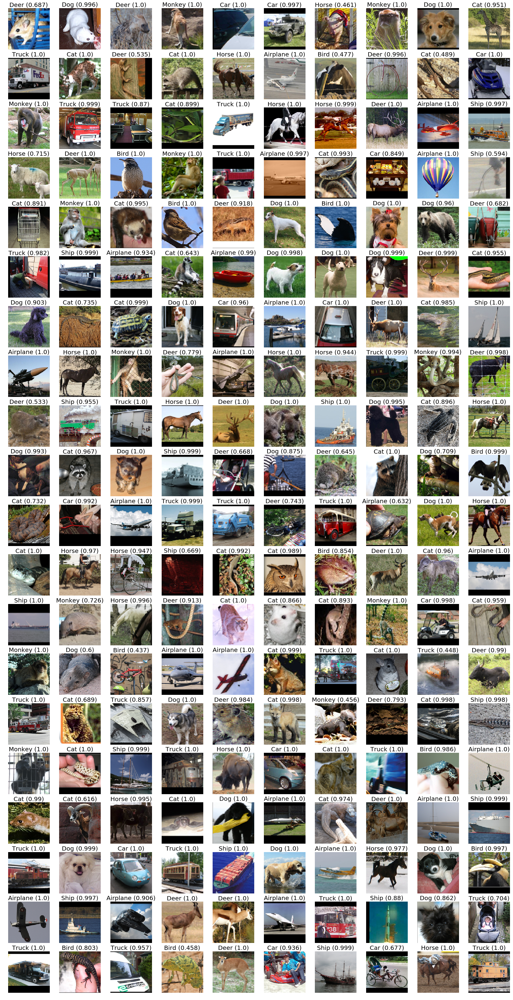

In [50]:
s = SummaryUnlabeled()
images = s.random_data(200)
labels, values = s.get_labels(images)
s.display_data_more(images, labels, values, 60, 30, 20, 10)

**Analysis:**

Given the unlabeled dataset contains objects beyond the 10 object classes available in the labeled STL-10 dataset, it is natural that there are serveral approximations done by the ResNet50-based classifier (which is also only 93% correct against the test subset of STL-10 dataset). Now, the important question is how close is the approximation with respect to the features of the corresponding STL-10 label when the softmax probability for the labeling is close to 1.0, say more than 0.90. We list a few cases (since the images are random, the cases below may not exactly correspond to different runs of the above images):

* **Cat:** Mongoose, Cougar, Raccoon, Iguana, Rat, Squirrel, Lioness
* **Horse:** Cow, Donkey, Byson,   
* **Deer:** Goat, Alpaka, 
* **Monkey:** Chimpanzee, Baboon, Gorilla
* **Bird:** Cobra, Iguana 

It appears that the softmax probability is higher of features are more and more similar to the corresponding STL-10 class. 

### 9.4.2. Labelling unlabeled images based on softmax threshold 

In [48]:
indices = s.get_indices(threshold=0.999, how_many=1000)

D:\anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:41: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


D:\anaconda3\envs\tensorflow-gpu\lib\site-packages\ipykernel_launcher.py:41: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


<Figure size 3840x7680 with 0 Axes>

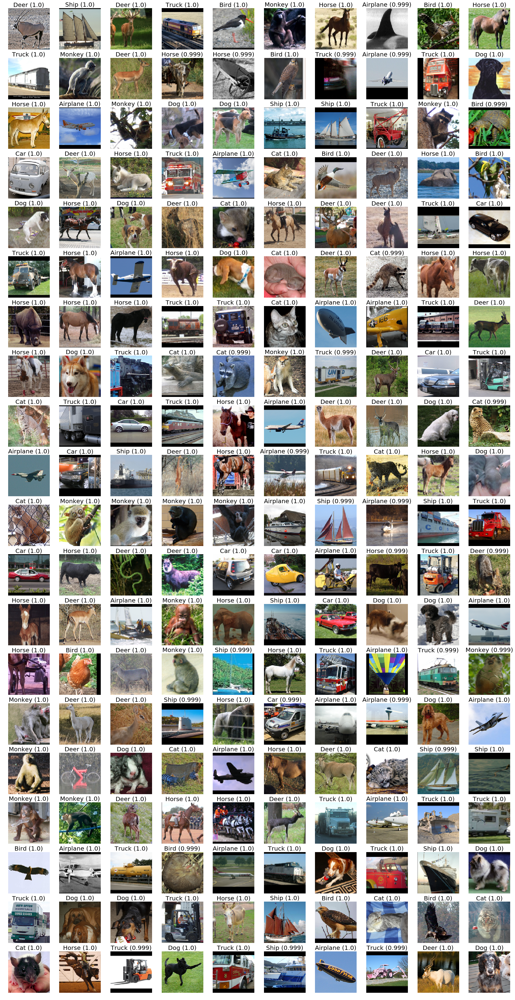

In [49]:
images = []
for i in range(len(indices)):
    images.append(x_unlabeled[indices[i]])
labels, values = s.get_labels(images)
s.display_data_more(images, labels, values, 60, 30, 20, 10)

**Analysis**

Since the image distribution is similar but more diverse in the unlabeled STL-10 dataset, we have a number of wrong identifications with very high probability (0.999 or more). Let us look at a few such cases:

* **Cat:** Cheetah, Leopard, Raccoon, Lioness, Cougar
* **Deer:** Goat, Sheep, Alpaka 
* **Dog:** Bear, Wolf, Panda 
* **Horse:** Cow, Donkey, Rhino
* **Monkey:** Chimpanzee, Baboon, Gorilla
* **Truck:** Train, Jeep, Bus

Even though in the test subset, there is no Cheetah, Leopard, Raccoon, Lioness, Cougar, adding these images as cats in the training dataset *may enhance and diversify the features* of cats and improve performance on the test subset. A similar assumption may be applicable for the classes: dog, horse, monkey, deer, truck, etc.

# 10. Augmentation for the model from Scratch

Since we have a large unlabeled image dataset, we restrict our augmentation of the training dataset on adding images selected from that unlabeled dataset based on the following assumptions:
* Feature-extraction from a pre-trained imagenet model and finetuning it for the STL-10 classes will result
    * A reliable classifier for the unlabeled STL-10 data to label with one of the 10 classes from STL-10 dataset
* Images classified with high softmax probability (0.999 or more) has one of the following properties:
    * The image belongs to the correct STL-10 class
    * The image shares great similarities in features of the corresponding correct STL-10 class
* Adding imperfections in the training dataset diversifies relevant features and improves test accuracy 
    * Example: a wolf is not a dog, but a certain dog breed may look like a wolf

## 10.1. Class to handle data augmentation from unlabeled data

In [20]:
class AugmentTraining:
    def __init__(self, threshold, how_many):
        self.threshold = threshold
        self.how_many = how_many
        
    def get_labeled_images(self):
        print("Collecting images")
        s = SummaryUnlabeled()
        indices = s.get_indices(self.threshold, self.how_many)
        images = []
        for i in range(len(indices)):
            images.append(x_unlabeled[indices[i]])
        labels, values = s.get_labels(images)
        print("Images collected")
        return images, labels

    def get_preprocessed_augmented_training_data(self):
        print("Augmenting training data")
        x_train_augmented = x_train.tolist()
        y_train_augmented = y_train.tolist()
        for i in range(len(images)):
            x_train_augmented.append(images[i])
            y_train_augmented.append(labels[i])    
        x_train_augmented = np.array(x_train_augmented)
        y_train_augmented = np.array(y_train_augmented)
        print("Augmentation completed")
        print("Preprocessing augmented data")
        x_train_augmented_normalized = (x_train_augmented)/255.0
        y_train_augmented_categorical = np_utils.to_categorical(y_train_augmented, 10)
        print("Preprocessing completed")
        return x_train_augmented_normalized, y_train_augmented_categorical

## 10.2. Augment data 

In [14]:
def labels_frequency(y):
    # histogram of label frequency
    hist, bins = np.histogram(y, bins=10)
    width = 0.75 * (bins[1] - bins[0])
    center = (bins[:-1] + bins[1:]) / 2
    plt.bar(center, hist, align='center', width=width)
    plt.show()

### 10.2.1. Add 4000 images with softmax probability at least 0.999

Loaded:  (9000, 96, 96, 3)   (9000, 10)


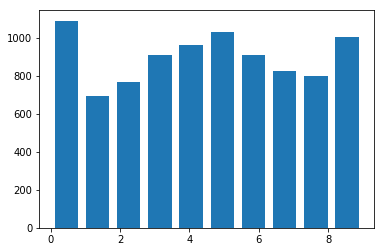

In [17]:
if os.path.isfile(config['augmented_train_data'] + '/train_9000.npz'):
    x_train_augmented_normalized = np.load(config['augmented_train_data'] + '/train_9000.npz')['x'] 
    y_train_augmented_categorical = np.load(config['augmented_train_data'] + '/train_9000.npz')['y']
    print('Loaded: ', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
else:
    aug = AugmentTraining(0.999, 4000)
    images, labels = aug.get_labeled_images()
    x_train_augmented_normalized, y_train_augmented_categorical = aug.get_preprocessed_augmented_training_data()
    images = None
    lables = None
    print('Computed', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
    np.savez_compressed(config['augmented_train_data'] + "/train_9000.npz", 
                        x=x_train_augmented_normalized, 
                        y=y_train_augmented_categorical)
    
labels_frequency(np.argmax(y_train_augmented_categorical, axis=1))

#### 10.2.1.1 Fit augmented data (9000 x 96 x 96 x 3)

In [25]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_9000.hdf5'):
    pass
else:
    model = ModelFromScratch()
    model.build(x_train_normalized.shape[1:], [80, 80, 80], 4, [1280], 'relu', 10)
    model.compile(rate=0.00009, beta_1=0.99, beta_2=0.999)
    model.fit_augmented('model_80x3_4_1280_relu_augmented_9000.hdf5', 50)

Train on 7200 samples, validate on 1800 samples
Epoch 1/50
 - 18s - loss: 3.5410 - acc: 0.2615 - val_loss: 1.8979 - val_acc: 0.4206

Epoch 00001: val_acc improved from -inf to 0.42056, saving model to model_80x3_4_1280_relu_augmented_9000.hdf5
Epoch 2/50
 - 17s - loss: 2.2568 - acc: 0.3865 - val_loss: 1.5314 - val_acc: 0.4556

Epoch 00002: val_acc improved from 0.42056 to 0.45556, saving model to model_80x3_4_1280_relu_augmented_9000.hdf5
Epoch 3/50
 - 16s - loss: 1.8414 - acc: 0.4299 - val_loss: 1.4336 - val_acc: 0.4939

Epoch 00003: val_acc improved from 0.45556 to 0.49389, saving model to model_80x3_4_1280_relu_augmented_9000.hdf5
Epoch 4/50
 - 17s - loss: 1.5509 - acc: 0.4819 - val_loss: 1.4387 - val_acc: 0.4922

Epoch 00004: val_acc did not improve
Epoch 5/50
 - 17s - loss: 1.3930 - acc: 0.5068 - val_loss: 1.3708 - val_acc: 0.5044

Epoch 00005: val_acc improved from 0.49389 to 0.50444, saving model to model_80x3_4_1280_relu_augmented_9000.hdf5
Epoch 6/50
 - 17s - loss: 1.3018 - ac

#### 10.2.1.2. Test using weights trained from augmented data (9000 x 96 x96 x3)

In [56]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_9000.hdf5'):
    model.test('model_80x3_4_1280_relu_augmented_9000.hdf5')
else:
    pass

Test accuracy: 67.2000%


### 10.2.2. Add 8000 images with softmax probability at least 0.999

Loaded:  (13000, 96, 96, 3)   (13000, 10)


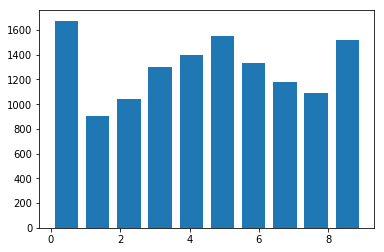

In [18]:
if os.path.isfile(config['augmented_train_data'] + '/train_13000.npz'):
    x_train_augmented_normalized = np.load(config['augmented_train_data'] + '/train_13000.npz')['x'] 
    y_train_augmented_categorical = np.load(config['augmented_train_data'] + '/train_13000.npz')['y']
    print('Loaded: ', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
else:
    aug = AugmentTraining(0.999, 8000)
    images, labels = aug.get_labeled_images()
    x_train_augmented_normalized, y_train_augmented_categorical = aug.get_preprocessed_augmented_training_data()
    images = None
    lables = None
    print('Computed', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
    np.savez_compressed(config['augmented_train_data'] + "/train_13000.npz", 
                        x=x_train_augmented_normalized, 
                        y=y_train_augmented_categorical)

labels_frequency(np.argmax(y_train_augmented_categorical, axis=1))

#### 10.2.2.1 Fit augmented data (13000 x 96 x 96 x 3)

In [28]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_13000.hdf5'):
    pass
else:
    model = ModelFromScratch()
    model.build(x_train_normalized.shape[1:], [80, 80, 80], 4, [1280], 'relu', 10)
    model.compile(rate=0.00009, beta_1=0.99, beta_2=0.999)
    model.fit_augmented('model_80x3_4_1280_relu_augmented_13000.hdf5', 50)

Train on 10400 samples, validate on 2600 samples
Epoch 1/50
 - 25s - loss: 3.2591 - acc: 0.2868 - val_loss: 1.6643 - val_acc: 0.4381

Epoch 00001: val_acc improved from -inf to 0.43808, saving model to model_80x3_4_1280_relu_augmented_13000.hdf5
Epoch 2/50
 - 24s - loss: 1.9792 - acc: 0.4078 - val_loss: 1.4157 - val_acc: 0.4900

Epoch 00002: val_acc improved from 0.43808 to 0.49000, saving model to model_80x3_4_1280_relu_augmented_13000.hdf5
Epoch 3/50
 - 24s - loss: 1.6191 - acc: 0.4472 - val_loss: 1.4169 - val_acc: 0.5169

Epoch 00003: val_acc improved from 0.49000 to 0.51692, saving model to model_80x3_4_1280_relu_augmented_13000.hdf5
Epoch 4/50
 - 24s - loss: 1.4218 - acc: 0.4960 - val_loss: 1.3196 - val_acc: 0.5300

Epoch 00004: val_acc improved from 0.51692 to 0.53000, saving model to model_80x3_4_1280_relu_augmented_13000.hdf5
Epoch 5/50
 - 24s - loss: 1.3150 - acc: 0.5267 - val_loss: 1.2419 - val_acc: 0.5592

Epoch 00005: val_acc improved from 0.53000 to 0.55923, saving model t

#### 10.2.2.2. Test using weights trained from augmented data (13000 x 96 x96 x3)

In [29]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_13000.hdf5'):
    model.test('model_80x3_4_1280_relu_augmented_13000.hdf5')
else:
    pass

Test accuracy: 68.9250%


### 10.2.3. Add 12000 images with softmax probability at least 0.999

Loaded:  (17000, 96, 96, 3)   (17000, 10)


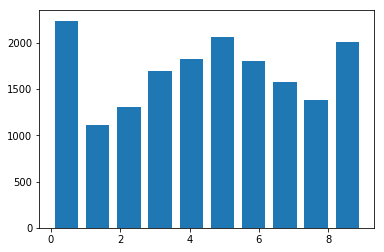

In [19]:
if os.path.isfile(config['augmented_train_data'] + '/train_17000.npz'):
    x_train_augmented_normalized = np.load(config['augmented_train_data'] + '/train_17000.npz')['x'] 
    y_train_augmented_categorical = np.load(config['augmented_train_data'] + '/train_17000.npz')['y']
    print('Loaded: ', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
else:
    aug = AugmentTraining(0.999, 12000)
    images, labels = aug.get_labeled_images()
    x_train_augmented_normalized, y_train_augmented_categorical = aug.get_preprocessed_augmented_training_data()
    images = None
    lables = None
    print('Computed', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
    np.savez_compressed(config['augmented_train_data'] + "/train_17000.npz", 
                        x=x_train_augmented_normalized, 
                        y=y_train_augmented_categorical)

labels_frequency(np.argmax(y_train_augmented_categorical, axis=1))

#### 10.2.3.1 Fit augmented data (17000 x 96 x 96 x 3)

In [22]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_17000.hdf5'):
    pass
else:
    model = ModelFromScratch()
    model.build(x_train_normalized.shape[1:], [80, 80, 80], 4, [1280], 'relu', 10)
    model.compile(rate=0.00009, beta_1=0.99, beta_2=0.999)
    model.fit_augmented('model_80x3_4_1280_relu_augmented_17000.hdf5', 50)

Train on 13600 samples, validate on 3400 samples
Epoch 1/50
 - 38s - loss: 3.1239 - acc: 0.3078 - val_loss: 1.7024 - val_acc: 0.4194

Epoch 00001: val_acc improved from -inf to 0.41941, saving model to model_80x3_4_1280_relu_augmented_17000.hdf5
Epoch 2/50
 - 31s - loss: 1.8781 - acc: 0.4043 - val_loss: 1.4923 - val_acc: 0.4721

Epoch 00002: val_acc improved from 0.41941 to 0.47206, saving model to model_80x3_4_1280_relu_augmented_17000.hdf5
Epoch 3/50
 - 32s - loss: 1.5358 - acc: 0.4588 - val_loss: 1.4228 - val_acc: 0.4829

Epoch 00003: val_acc improved from 0.47206 to 0.48294, saving model to model_80x3_4_1280_relu_augmented_17000.hdf5
Epoch 4/50
 - 32s - loss: 1.3811 - acc: 0.5029 - val_loss: 1.3184 - val_acc: 0.5353

Epoch 00004: val_acc improved from 0.48294 to 0.53529, saving model to model_80x3_4_1280_relu_augmented_17000.hdf5
Epoch 5/50
 - 32s - loss: 1.2710 - acc: 0.5384 - val_loss: 1.2320 - val_acc: 0.5644

Epoch 00005: val_acc improved from 0.53529 to 0.56441, saving model t

#### 10.2.3.2. Test using weights trained from augmented data (17000 x 96 x96 x3)

In [23]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_17000.hdf5'):
    model.test('model_80x3_4_1280_relu_augmented_17000.hdf5')
else:
    pass

Test accuracy: 71.6375%


### 10.2.4. Add 16000 images with softmax probability at least 0.999

Loaded:  (21000, 96, 96, 3)   (21000, 10)


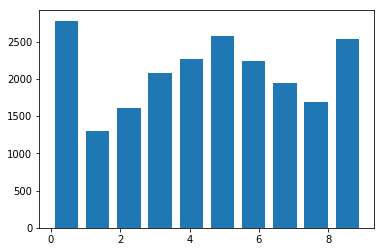

In [20]:
if os.path.isfile(config['augmented_train_data'] + '/train_21000.npz'):
    x_train_augmented_normalized = np.load(config['augmented_train_data'] + '/train_21000.npz')['x'] 
    y_train_augmented_categorical = np.load(config['augmented_train_data'] + '/train_21000.npz')['y']
    print('Loaded: ', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
else:
    aug = AugmentTraining(0.999, 16000)
    images, labels = aug.get_labeled_images()
    x_train_augmented_normalized, y_train_augmented_categorical = aug.get_preprocessed_augmented_training_data()
    images = None
    lables = None
    print('Computed', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
    np.savez_compressed(config['augmented_train_data'] + "/train_21000.npz", 
                        x=x_train_augmented_normalized, 
                        y=y_train_augmented_categorical)

labels_frequency(np.argmax(y_train_augmented_categorical, axis=1))

#### 10.2.4.1 Fit augmented data (21000 x 96 x 96 x 3)

In [25]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_21000.hdf5'):
    pass
else:
    model = ModelFromScratch()
    model.build(x_train_normalized.shape[1:], [80, 80, 80], 4, [1280], 'relu', 10)
    model.compile(rate=0.00009, beta_1=0.99, beta_2=0.999)
    model.fit_augmented('model_80x3_4_1280_relu_augmented_21000.hdf5', 50)

Train on 16800 samples, validate on 4200 samples
Epoch 1/50
 - 41s - loss: 2.9664 - acc: 0.3195 - val_loss: 1.4681 - val_acc: 0.4771

Epoch 00001: val_acc improved from -inf to 0.47714, saving model to model_80x3_4_1280_relu_augmented_21000.hdf5
Epoch 2/50
 - 39s - loss: 1.7781 - acc: 0.4367 - val_loss: 1.3708 - val_acc: 0.5174

Epoch 00002: val_acc improved from 0.47714 to 0.51738, saving model to model_80x3_4_1280_relu_augmented_21000.hdf5
Epoch 3/50
 - 39s - loss: 1.4321 - acc: 0.4910 - val_loss: 1.2161 - val_acc: 0.5760

Epoch 00003: val_acc improved from 0.51738 to 0.57595, saving model to model_80x3_4_1280_relu_augmented_21000.hdf5
Epoch 4/50
 - 39s - loss: 1.2908 - acc: 0.5321 - val_loss: 1.1656 - val_acc: 0.5886

Epoch 00004: val_acc improved from 0.57595 to 0.58857, saving model to model_80x3_4_1280_relu_augmented_21000.hdf5
Epoch 5/50
 - 39s - loss: 1.1935 - acc: 0.5669 - val_loss: 1.1018 - val_acc: 0.6160

Epoch 00005: val_acc improved from 0.58857 to 0.61595, saving model t

#### 10.2.4.2. Test using weights trained from augmented data (21000 x 96 x96 x3)

In [26]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_21000.hdf5'):
    model.test('model_80x3_4_1280_relu_augmented_21000.hdf5')
else:
    pass

Test accuracy: 73.2375%


### 10.2.5. Add 20000 images with softmax probability at least 0.999

Loaded:  (25000, 96, 96, 3)   (25000, 10)


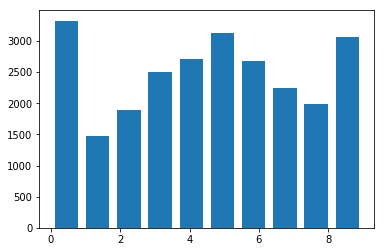

In [21]:
if os.path.isfile(config['augmented_train_data'] + '/train_25000.npz'):
    x_train_augmented_normalized = np.load(config['augmented_train_data'] + '/train_25000.npz')['x'] 
    y_train_augmented_categorical = np.load(config['augmented_train_data'] + '/train_25000.npz')['y']
    print('Loaded: ', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
else:
    aug = AugmentTraining(0.999, 20000)
    images, labels = aug.get_labeled_images()
    x_train_augmented_normalized, y_train_augmented_categorical = aug.get_preprocessed_augmented_training_data()
    images = None
    lables = None
    print('Computed', x_train_augmented_normalized.shape, ' ', y_train_augmented_categorical.shape)
    np.savez_compressed(config['augmented_train_data'] + "/train_25000.npz", 
                        x=x_train_augmented_normalized, 
                        y=y_train_augmented_categorical)

labels_frequency(np.argmax(y_train_augmented_categorical, axis=1))

#### 10.2.5.1 Fit augmented data (25000 x 96 x 96 x 3)

In [23]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_25000.hdf5'):
    pass
else:
    model = ModelFromScratch()
    model.build(x_train_normalized.shape[1:], [80, 80, 80], 4, [1280], 'relu', 10)
    model.compile(rate=0.00009, beta_1=0.99, beta_2=0.999)
    model.fit_augmented('model_80x3_4_1280_relu_augmented_25000.hdf5', 50)

Train on 20000 samples, validate on 5000 samples
Epoch 1/50
 - 50s - loss: 2.8322 - acc: 0.3238 - val_loss: 1.5380 - val_acc: 0.4384

Epoch 00001: val_acc improved from -inf to 0.43840, saving model to model_80x3_4_1280_relu_augmented_25000.hdf5
Epoch 2/50
 - 46s - loss: 1.6594 - acc: 0.4380 - val_loss: 1.3995 - val_acc: 0.5160

Epoch 00002: val_acc improved from 0.43840 to 0.51600, saving model to model_80x3_4_1280_relu_augmented_25000.hdf5
Epoch 3/50
 - 46s - loss: 1.3955 - acc: 0.4999 - val_loss: 1.2645 - val_acc: 0.5574

Epoch 00003: val_acc improved from 0.51600 to 0.55740, saving model to model_80x3_4_1280_relu_augmented_25000.hdf5
Epoch 4/50
 - 46s - loss: 1.2603 - acc: 0.5467 - val_loss: 1.2014 - val_acc: 0.5744

Epoch 00004: val_acc improved from 0.55740 to 0.57440, saving model to model_80x3_4_1280_relu_augmented_25000.hdf5
Epoch 5/50
 - 46s - loss: 1.1538 - acc: 0.5843 - val_loss: 1.1436 - val_acc: 0.5978

Epoch 00005: val_acc improved from 0.57440 to 0.59780, saving model t

#### 10.2.5.2. Test using weights trained from augmented data (25000 x 96 x96 x3)

In [13]:
if os.path.isfile('model_80x3_4_1280_relu_augmented_25000.hdf5'):
    model.test('model_80x3_4_1280_relu_augmented_25000.hdf5')
else:
    pass

Test accuracy: 75.6375%


# 11. Performance summary of the CNN Model from Scratch 

| Training set-size | Epochs | Training loss | Training accuracy | Validation loss | Validation accuracy | Test accuracy | 
|:-----------------:|:------:|:-------------:|:-----------------:|:---------------:|:-------------------:|:-------------:|
| 5000 (original)   | 50     | 0.1259        | 96.10%            | 1.1916          | 63.300%             | 61.600%       |
| 9000              | 50     | 0.0939        | 96.85%            | 1.1868          | 65.667%             | 67.200%       |
| 13000             | 50     | 0.1165        | 96.15%            | 0.9556          | 70.425%             | 68.925%       |      
| 17000             | 50     | 0.0880        | 97.07%            | 0.9687          | 72.059%             | 71.638%       |
| 21000             | 50     | 0.1491        | 95.09%            | 0.8308          | 73.667%             | 73.238%       |   
| 25000             | 50     | 0.0887        | 96.95%            | 0.9341          | 74.200%             | 75.638%       |

**Observations**
* The model obtains a test accuracy more than 60% on the original training subset
* Validation accuracy on the original as well as the augmented training datasets generalize really good on the training subset
* Test accuracy increases as more relevant images from the unlabeled dataset is added to the training subset
* Adding imperfections in the training dataset does not make any negative impact on the model from scratch 
    * As anticipated, imperfections have actually helped to diversify features for the dataset classes
        * Example: Identifying a bear or a wolf as a dog 
        * Example: Identifying a donkey or a cow as a horse
        * Example: Identifying a cheetah or a leopard as a cat 

## 11.1. Some pictures from the web 

<Figure size 3840x1920 with 0 Axes>

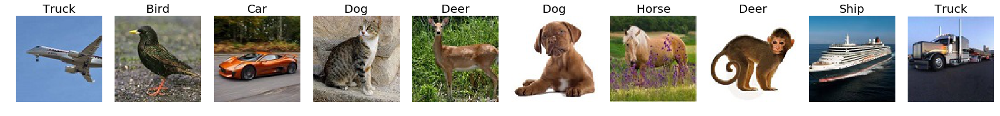

In [63]:
images = s.images_from_a_folder('./images/*.*')
labels = []
for i in range(len(images)):
    img = np.expand_dims(images[i], axis=0)
    img_class = np.argmax(model.predict(img))
    labels.append(img_class)
    
s.display_data(images, labels, 1, len(images))

With only 75% accuracy, it is expected that on randomly selected images, there will be misclassifications. Yet, the model seems to perform quite well as in the set of internet pictures (resized to 96 x 96 x 3)

# 12. Conclusion

Due to limitations in time and computing resources, we could not perform further experiments, but we have achieved the goals of this project and found a constructive way to improve performance of a model from scratch to perform consistantly better on the STL-10 dataset. In other words, we have determined a scalable method to obtain better performance on the dataset.  

Note that we have a state-of-the-art performance using a model from scratch on the STL-10 dataset but only with help of transfer learning while understanding the unlabeled data. We have obtained this performance without applying popular preprocessing and image augmentations techniques. 

Since we have devised a process involving a basic model from scratch, we may consider the following to improve performance further:
* How we initialize the weights, learning rates, and other parameters? (say, we restart fitting with the previous best weight)
* Tune the structure of the Symmetric model from scratch
* Given required resources are available, popular preprocessing and augmentation techniques can be used